In [ ]:
import sys
sys.executable


'/usr/bin/python3'

In [ ]:
!pip install lime
!pip install shap
!pip install xgboost
!pip install category_encoders

In [ ]:
import numpy as np
import pandas as pd
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from category_encoders import TargetEncoder
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/AmesHousing.csv")
df.head()

,Order,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
0,1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
1,2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
2,3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
3,4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
4,5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [ ]:
df.shape

(2930, 82)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2930 entries, 0 to 2929
Data columns (total 82 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Order            2930 non-null   int64  
 1   PID              2930 non-null   int64  
 2   MS SubClass      2930 non-null   int64  
 3   MS Zoning        2930 non-null   object 
 4   Lot Frontage     2440 non-null   float64
 5   Lot Area         2930 non-null   int64  
 6   Street           2930 non-null   object 
 7   Alley            198 non-null    object 
 8   Lot Shape        2930 non-null   object 
 9   Land Contour     2930 non-null   object 
 10  Utilities        2930 non-null   object 
 11  Lot Config       2930 non-null   object 
 12  Land Slope       2930 non-null   object 
 13  Neighborhood     2930 non-null   object 
 14  Condition 1      2930 non-null   object 
 15  Condition 2      2930 non-null   object 
 16  Bldg Type        2930 non-null   object 
 17  House Style   

In [ ]:
df.columns

Index(['Order', 'PID', 'MS SubClass', 'MS Zoning', 'Lot Frontage', 'Lot Area',
       'Street', 'Alley', 'Lot Shape', 'Land Contour', 'Utilities',
       'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1',
       'Condition 2', 'Bldg Type', 'House Style', 'Overall Qual',
       'Overall Cond', 'Year Built', 'Year Remod/Add', 'Roof Style',
       'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type',
       'Mas Vnr Area', 'Exter Qual', 'Exter Cond', 'Foundation', 'Bsmt Qual',
       'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin SF 1',
       'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF',
       'Heating', 'Heating QC', 'Central Air', 'Electrical', '1st Flr SF',
       '2nd Flr SF', 'Low Qual Fin SF', 'Gr Liv Area', 'Bsmt Full Bath',
       'Bsmt Half Bath', 'Full Bath', 'Half Bath', 'Bedroom AbvGr',
       'Kitchen AbvGr', 'Kitchen Qual', 'TotRms AbvGrd', 'Functional',
       'Fireplaces', 'Fireplace Qu', 'Garage Type', 'Garage Yr Blt',
      

In [ ]:
df.describe()

,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
count,2930.00000,2.930000e+03,2930.000000,2440.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2907.000000,...,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000,2930.000000
mean,1465.50000,7.144645e+08,57.387372,69.224590,10147.921843,6.094881,5.563140,1971.356314,1984.266553,101.896801,...,93.751877,47.533447,23.011604,2.592491,16.002048,2.243345,50.635154,6.216041,2007.790444,180796.060068
std,845.96247,1.887308e+08,42.638025,23.365335,7880.017759,1.411026,1.111537,30.245361,20.860286,179.112611,...,126.361562,67.483400,64.139059,25.141331,56.087370,35.597181,566.344288,2.714492,1.316613,79886.692357
min,1.00000,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,12789.000000
25%,733.25000,5.284770e+08,20.000000,58.000000,7440.250000,5.000000,5.000000,1954.000000,1965.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129500.000000
50%,1465.50000,5.354536e+08,50.000000,68.000000,9436.500000,6.000000,5.000000,1973.000000,1993.000000,0.000000,...,0.000000,27.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,160000.000000
75%,2197.75000,9.071811e+08,70.000000,80.000000,11555.250000,7.000000,6.000000,2001.000000,2004.000000,164.000000,...,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,213500.000000
max,2930.00000,1.007100e+09,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,...,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


In [ ]:
df.isna().sum()

Order               0
PID                 0
MS SubClass         0
MS Zoning           0
Lot Frontage      490
                 ... 
Mo Sold             0
Yr Sold             0
Sale Type           0
Sale Condition      0
SalePrice           0
Length: 82, dtype: int64

In [ ]:
df.describe(include = 'object')

,MS Zoning,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,...,Garage Type,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Pool QC,Fence,Misc Feature,Sale Type,Sale Condition
count,2930,2930,198,2930,2930,2930,2930,2930,2930,2930,...,2773,2771,2771,2771,2930,13,572,106,2930,2930
unique,7,2,2,4,4,3,5,3,28,9,...,6,3,5,5,3,4,4,5,10,6
top,RL,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,Ex,MnPrv,Shed,WD,Normal
freq,2273,2918,120,1859,2633,2927,2140,2789,443,2522,...,1731,1231,2615,2665,2652,4,330,95,2536,2413


In [ ]:
df_numerics = df.select_dtypes(include=np.number)
print(f"There are total {df_numerics.shape[1]} features with numeric datatypes as follows: \n {df_numerics.columns.values}")

There are total 39 features with numeric datatypes as follows: 
 ['Order' 'PID' 'MS SubClass' 'Lot Frontage' 'Lot Area' 'Overall Qual'
 'Overall Cond' 'Year Built' 'Year Remod/Add' 'Mas Vnr Area'
 'BsmtFin SF 1' 'BsmtFin SF 2' 'Bsmt Unf SF' 'Total Bsmt SF' '1st Flr SF'
 '2nd Flr SF' 'Low Qual Fin SF' 'Gr Liv Area' 'Bsmt Full Bath'
 'Bsmt Half Bath' 'Full Bath' 'Half Bath' 'Bedroom AbvGr' 'Kitchen AbvGr'
 'TotRms AbvGrd' 'Fireplaces' 'Garage Yr Blt' 'Garage Cars' 'Garage Area'
 'Wood Deck SF' 'Open Porch SF' 'Enclosed Porch' '3Ssn Porch'
 'Screen Porch' 'Pool Area' 'Misc Val' 'Mo Sold' 'Yr Sold' 'SalePrice']


In [ ]:
df_objects = df.select_dtypes(include="object")
print(f"There are total {df_objects.shape[1]} features with object datatypes as follows: \n {df_objects.columns.values}")

There are total 43 features with object datatypes as follows: 
 ['MS Zoning' 'Street' 'Alley' 'Lot Shape' 'Land Contour' 'Utilities'
 'Lot Config' 'Land Slope' 'Neighborhood' 'Condition 1' 'Condition 2'
 'Bldg Type' 'House Style' 'Roof Style' 'Roof Matl' 'Exterior 1st'
 'Exterior 2nd' 'Mas Vnr Type' 'Exter Qual' 'Exter Cond' 'Foundation'
 'Bsmt Qual' 'Bsmt Cond' 'Bsmt Exposure' 'BsmtFin Type 1' 'BsmtFin Type 2'
 'Heating' 'Heating QC' 'Central Air' 'Electrical' 'Kitchen Qual'
 'Functional' 'Fireplace Qu' 'Garage Type' 'Garage Finish' 'Garage Qual'
 'Garage Cond' 'Paved Drive' 'Pool QC' 'Fence' 'Misc Feature' 'Sale Type'
 'Sale Condition']


In [ ]:
# Checking for missing values in my data
df_missing = df[df.columns[df.isnull().any()].tolist()]
print(f"There are total {df_missing.shape[1]} features with missing values as follows: \n {df_missing.columns.values}")

There are total 27 features with missing values as follows: 
 ['Lot Frontage' 'Alley' 'Mas Vnr Type' 'Mas Vnr Area' 'Bsmt Qual'
 'Bsmt Cond' 'Bsmt Exposure' 'BsmtFin Type 1' 'BsmtFin SF 1'
 'BsmtFin Type 2' 'BsmtFin SF 2' 'Bsmt Unf SF' 'Total Bsmt SF'
 'Electrical' 'Bsmt Full Bath' 'Bsmt Half Bath' 'Fireplace Qu'
 'Garage Type' 'Garage Yr Blt' 'Garage Finish' 'Garage Cars' 'Garage Area'
 'Garage Qual' 'Garage Cond' 'Pool QC' 'Fence' 'Misc Feature']


In [ ]:
df = df.set_index("Order")

In [ ]:
df.head()

,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,...,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,Sale Condition,SalePrice
Order,,,,,,,,,,,,,,,,,,,,,
1,526301100,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2010,WD,Normal,215000
2,526350040,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal,105000
3,526351010,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal,172000
4,526353030,20,RL,93.0,11160,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,244000
5,527105010,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal,189900


In [ ]:
# imputing numeric values with mean
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')

imputer = imputer.fit(df_numerics)
idf = pd.DataFrame(imputer.transform(df_numerics))
idf.columns = df_numerics.columns
idf.index= df_numerics.index
df_numerics1 = idf

imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

imputer = imputer.fit(df_objects)
idf = pd.DataFrame(imputer.transform(df_objects))
idf.columns = df_objects.columns
idf.index= df_objects.index
df_objects1 = idf

#Binding the imputed dataframe
df_imputed = pd.concat([df_numerics1.reset_index(drop=True), df_objects1], axis=1)

#I decided to drop Fence, Alley, PoolQC and Misc Features as they have more than 80% of missing values in my dataframe
df_NewData = df_imputed.drop(columns=["Fence", "Alley", "Pool QC", "Misc Feature"])
df_NewData

,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Kitchen Qual,Functional,Fireplace Qu,Garage Type,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Sale Type,Sale Condition
0,1.0,526301100.0,20.0,141.00000,31770.0,6.0,5.0,1960.0,1960.0,112.0,...,TA,Typ,Gd,Attchd,Fin,TA,TA,P,WD,Normal
1,2.0,526350040.0,20.0,80.00000,11622.0,5.0,6.0,1961.0,1961.0,0.0,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
2,3.0,526351010.0,20.0,81.00000,14267.0,6.0,6.0,1958.0,1958.0,108.0,...,Gd,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
3,4.0,526353030.0,20.0,93.00000,11160.0,7.0,5.0,1968.0,1968.0,0.0,...,Ex,Typ,TA,Attchd,Fin,TA,TA,Y,WD,Normal
4,5.0,527105010.0,60.0,74.00000,13830.0,5.0,5.0,1997.0,1998.0,0.0,...,TA,Typ,TA,Attchd,Fin,TA,TA,Y,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2925,2926.0,923275080.0,80.0,37.00000,7937.0,6.0,6.0,1984.0,1984.0,0.0,...,TA,Typ,Gd,Detchd,Unf,TA,TA,Y,WD,Normal
2926,2927.0,923276100.0,20.0,69.22459,8885.0,5.0,5.0,1983.0,1983.0,0.0,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
2927,2928.0,923400125.0,85.0,62.00000,10441.0,5.0,5.0,1992.0,1992.0,0.0,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
2928,2929.0,924100070.0,20.0,77.00000,10010.0,5.0,5.0,1974.0,1975.0,0.0,...,TA,Typ,TA,Attchd,RFn,TA,TA,Y,WD,Normal


In [ ]:
# Identify categorical columns by checking their data types
categorical_columns = df_NewData.select_dtypes(include=['object', 'category'])

# Print the list of categorical columns
print(categorical_columns.columns.tolist())

['MS Zoning', 'Street', 'Lot Shape', 'Land Contour', 'Utilities', 'Lot Config', 'Land Slope', 'Neighborhood', 'Condition 1', 'Condition 2', 'Bldg Type', 'House Style', 'Roof Style', 'Roof Matl', 'Exterior 1st', 'Exterior 2nd', 'Mas Vnr Type', 'Exter Qual', 'Exter Cond', 'Foundation', 'Bsmt Qual', 'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin Type 2', 'Heating', 'Heating QC', 'Central Air', 'Electrical', 'Kitchen Qual', 'Functional', 'Fireplace Qu', 'Garage Type', 'Garage Finish', 'Garage Qual', 'Garage Cond', 'Paved Drive', 'Sale Type', 'Sale Condition']


In [ ]:
#To find out the number of unique values in each column
unique_counts = df_NewData.nunique()

# Print columns with a low number of unique values (e.g., < 10)
print(unique_counts[unique_counts < 10])

Overall Cond      9
Bsmt Full Bath    5
Bsmt Half Bath    4
Full Bath         5
Half Bath         3
Bedroom AbvGr     8
Kitchen AbvGr     4
Fireplaces        5
Garage Cars       7
Yr Sold           5
MS Zoning         7
Street            2
Lot Shape         4
Land Contour      4
Utilities         3
Lot Config        5
Land Slope        3
Condition 1       9
Condition 2       8
Bldg Type         5
House Style       8
Roof Style        6
Roof Matl         8
Mas Vnr Type      5
Exter Qual        4
Exter Cond        5
Foundation        6
Bsmt Qual         5
Bsmt Cond         5
Bsmt Exposure     4
BsmtFin Type 1    6
BsmtFin Type 2    6
Heating           6
Heating QC        5
Central Air       2
Electrical        5
Kitchen Qual      5
Functional        8
Fireplace Qu      5
Garage Type       6
Garage Finish     3
Garage Qual       5
Garage Cond       5
Paved Drive       3
Sale Condition    6
dtype: int64


In [ ]:
##DEALING WITH CATEGORICAL COLUMNS

In [ ]:
#Creating dummy variables for categorical features
df_Data = pd.get_dummies(df_NewData)

In [ ]:
print(df_Data.shape)
df_NewData.head()

(2930, 292)


,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Kitchen Qual,Functional,Fireplace Qu,Garage Type,Garage Finish,Garage Qual,Garage Cond,Paved Drive,Sale Type,Sale Condition
0,1.0,526301100.0,20.0,141.0,31770.0,6.0,5.0,1960.0,1960.0,112.0,...,TA,Typ,Gd,Attchd,Fin,TA,TA,P,WD,Normal
1,2.0,526350040.0,20.0,80.0,11622.0,5.0,6.0,1961.0,1961.0,0.0,...,TA,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
2,3.0,526351010.0,20.0,81.0,14267.0,6.0,6.0,1958.0,1958.0,108.0,...,Gd,Typ,Gd,Attchd,Unf,TA,TA,Y,WD,Normal
3,4.0,526353030.0,20.0,93.0,11160.0,7.0,5.0,1968.0,1968.0,0.0,...,Ex,Typ,TA,Attchd,Fin,TA,TA,Y,WD,Normal
4,5.0,527105010.0,60.0,74.0,13830.0,5.0,5.0,1997.0,1998.0,0.0,...,TA,Typ,TA,Attchd,Fin,TA,TA,Y,WD,Normal


In [ ]:
#Checking for missing values in the DataFrame
missing_values = df_NewData.isnull().sum()
print(missing_values)

Order             0
PID               0
MS SubClass       0
Lot Frontage      0
Lot Area          0
                 ..
Garage Qual       0
Garage Cond       0
Paved Drive       0
Sale Type         0
Sale Condition    0
Length: 78, dtype: int64


In [ ]:
##Association For Numerical Variables

In [ ]:
#  Getting pearson correlation matrix for all features
df_NewData_corr = df_NewData.corr()
df_NewData_corr

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


,Order,PID,MS SubClass,Lot Frontage,Lot Area,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Mas Vnr Area,...,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Misc Val,Mo Sold,Yr Sold,SalePrice
Order,1.000000,0.173593,0.011797,-0.006461,0.031354,-0.048500,-0.011054,-0.052319,-0.075566,-0.030818,...,-0.011292,0.016355,0.027908,-0.024975,0.004307,0.052518,-0.006083,0.133365,-0.975993,-0.031408
PID,0.173593,1.000000,-0.001281,-0.088419,0.034868,-0.263147,0.104451,-0.343388,-0.157111,-0.228392,...,-0.051135,-0.071311,0.162519,-0.024894,-0.025735,-0.002845,-0.008260,-0.050455,0.009579,-0.246521
MS SubClass,0.011797,-0.001281,1.000000,-0.392019,-0.204613,0.039419,-0.067349,0.036579,0.043397,0.002724,...,-0.017310,-0.014823,-0.022866,-0.037956,-0.050614,-0.003434,-0.029254,0.000350,-0.017905,-0.085092
Lot Frontage,-0.006461,-0.088419,-0.392019,1.000000,0.365503,0.198900,-0.067383,0.115688,0.085744,0.203383,...,0.104632,0.150426,0.011685,0.025501,0.070084,0.160698,0.035926,0.010177,-0.006921,0.340751
Lot Area,0.031354,0.034868,-0.204613,0.365503,1.000000,0.097188,-0.034759,0.023258,0.021682,0.126586,...,0.157212,0.103760,0.021868,0.016243,0.055044,0.093775,0.069188,0.003859,-0.023085,0.266549
Overall Qual,-0.048500,-0.263147,0.039419,0.198900,0.097188,1.000000,-0.094812,0.597027,0.569609,0.427470,...,0.255663,0.298412,-0.140332,0.018240,0.041615,0.030399,0.005179,0.031103,-0.020719,0.799262
Overall Cond,-0.011054,0.104451,-0.067349,-0.067383,-0.034759,-0.094812,1.000000,-0.368773,0.047680,-0.135088,...,0.020344,-0.068934,0.071459,0.043852,0.044055,-0.016787,0.034056,-0.007295,0.031207,-0.101697
Year Built,-0.052319,-0.343388,0.036579,0.115688,0.023258,0.597027,-0.368773,1.000000,0.612095,0.311828,...,0.228964,0.198365,-0.374364,0.015803,-0.041436,0.002213,-0.011011,0.014577,-0.013197,0.558426
Year Remod/Add,-0.075566,-0.157111,0.043397,0.085744,0.021682,0.569609,0.047680,0.612095,1.000000,0.196170,...,0.217857,0.241748,-0.220383,0.037412,-0.046888,-0.011410,-0.003132,0.018048,0.032652,0.532974
Mas Vnr Area,-0.030818,-0.228392,0.002724,0.203383,0.126586,0.427470,-0.135088,0.311828,0.196170,1.000000,...,0.165108,0.142766,-0.110447,0.013778,0.065622,0.004617,0.044932,-0.000275,-0.017665,0.505784


In [ ]:
#filter out features with strong correlation with target
saleprice_top20_corr = df_NewData_corr.SalePrice.abs().sort_values(ascending=False).head(20)
print(f"Top 20 features which are having strong correlation with SalePrice are \n {saleprice_top20_corr[1:]}")

Top 20 features which are having strong correlation with SalePrice are 
 Overall Qual      0.799262
Gr Liv Area       0.706780
Garage Cars       0.647861
Garage Area       0.640385
Total Bsmt SF     0.632105
1st Flr SF        0.621676
Year Built        0.558426
Full Bath         0.545604
Year Remod/Add    0.532974
Garage Yr Blt     0.510684
Mas Vnr Area      0.505784
TotRms AbvGrd     0.495474
Fireplaces        0.474558
BsmtFin SF 1      0.432794
Lot Frontage      0.340751
Wood Deck SF      0.327143
Open Porch SF     0.312951
Half Bath         0.285056
Bsmt Full Bath    0.275894
Name: SalePrice, dtype: float64


In [ ]:
# Correlation matrix for features with top 20 strong correlation features with SalePrice
df_NewData_top20_corr = df_NewData[saleprice_top20_corr.index].corr()
df_NewData_top20_corr

,SalePrice,Overall Qual,Gr Liv Area,Garage Cars,Garage Area,Total Bsmt SF,1st Flr SF,Year Built,Full Bath,Year Remod/Add,Garage Yr Blt,Mas Vnr Area,TotRms AbvGrd,Fireplaces,BsmtFin SF 1,Lot Frontage,Wood Deck SF,Open Porch SF,Half Bath,Bsmt Full Bath
SalePrice,1.000000,0.799262,0.706780,0.647861,0.640385,0.632105,0.621676,0.558426,0.545604,0.532974,0.510684,0.505784,0.495474,0.474558,0.432794,0.340751,0.327143,0.312951,0.285056,0.275894
Overall Qual,0.799262,1.000000,0.570556,0.599483,0.563445,0.547088,0.477837,0.597027,0.522263,0.569609,0.543079,0.427470,0.380693,0.393007,0.284011,0.198900,0.255663,0.298412,0.268853,0.167778
Gr Liv Area,0.706780,0.570556,1.000000,0.488794,0.484857,0.444567,0.562166,0.241726,0.630321,0.316855,0.263602,0.402648,0.807772,0.454924,0.209582,0.350728,0.250153,0.340857,0.433949,0.058333
Garage Cars,0.647861,0.599483,0.488794,1.000000,0.889676,0.437517,0.439435,0.537209,0.478131,0.425367,0.488719,0.359052,0.355552,0.321159,0.255436,0.290218,0.241210,0.204165,0.233406,0.161982
Garage Area,0.640385,0.563445,0.484857,0.889676,1.000000,0.485422,0.491197,0.479922,0.407421,0.376406,0.472896,0.372265,0.327276,0.293810,0.309831,0.337700,0.238354,0.232892,0.178315,0.184427
Total Bsmt SF,0.632105,0.547088,0.444567,0.437517,0.485422,1.000000,0.800659,0.407477,0.324915,0.297344,0.336066,0.395438,0.280635,0.333037,0.536547,0.329620,0.229910,0.245606,-0.055226,0.325915
1st Flr SF,0.621676,0.477837,0.562166,0.439435,0.491197,0.800659,1.000000,0.310463,0.371584,0.242108,0.253795,0.393666,0.390162,0.406345,0.457437,0.423170,0.227131,0.238041,-0.104203,0.259612
Year Built,0.558426,0.597027,0.241726,0.537209,0.479922,0.407477,0.310463,1.000000,0.469406,0.612095,0.790039,0.311828,0.111919,0.170672,0.279836,0.115688,0.228964,0.198365,0.269268,0.211818
Full Bath,0.545604,0.522263,0.630321,0.478131,0.407421,0.324915,0.371584,0.469406,1.000000,0.457266,0.479259,0.258663,0.528599,0.229793,0.077758,0.166997,0.179574,0.258675,0.159689,-0.022576
Year Remod/Add,0.532974,0.569609,0.316855,0.425367,0.376406,0.297344,0.242108,0.612095,0.457266,1.000000,0.627229,0.196170,0.197528,0.133322,0.151720,0.085744,0.217857,0.241748,0.211771,0.134318


`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


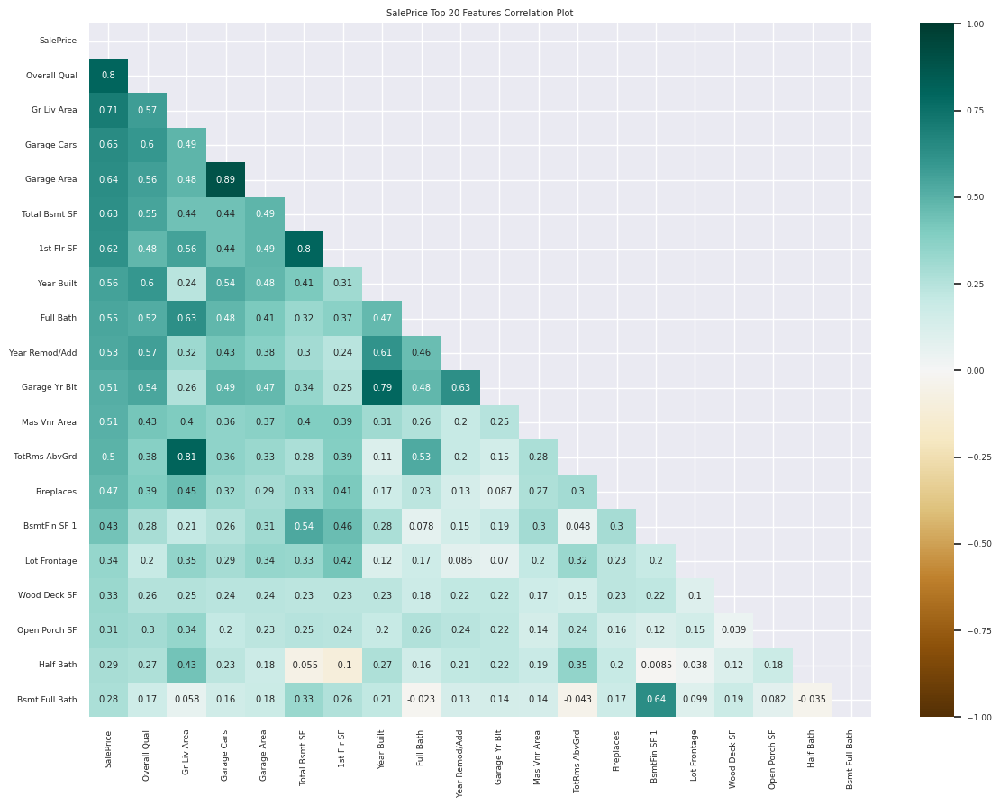

In [ ]:
plt.figure(figsize=(14, 10))

# Create a mask for the upper triangle of the heatmap
mask = np.triu(np.ones_like(df_NewData_top20_corr, dtype=np.bool))

# Generate the heatmap
sns.heatmap(df_NewData_top20_corr, mask=mask, vmin=-1, vmax=1, cmap='BrBG', annot=True).set(title="SalePrice Top 20 Features Correlation Plot")

# Show the plot
plt.show()

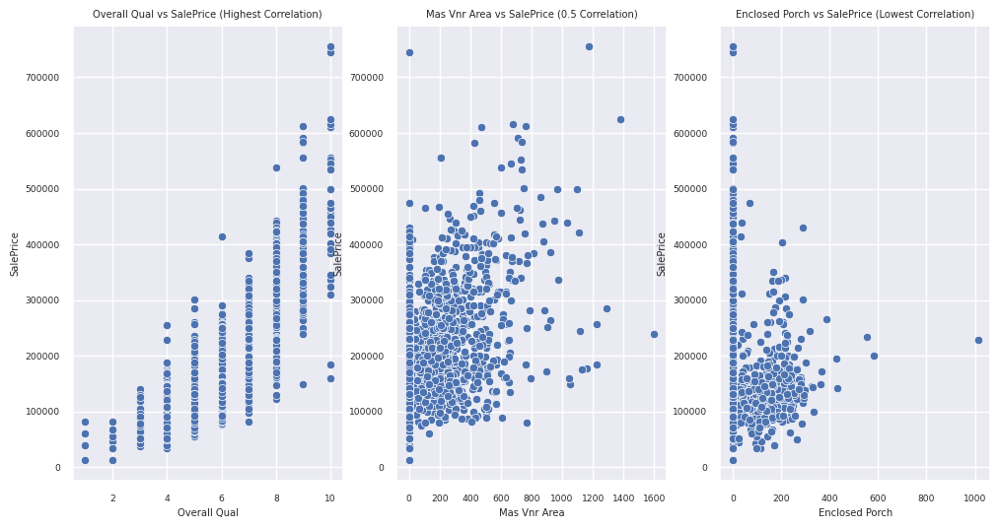

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(12, 6))
sns.set(font_scale = 0.6)

#Make a scatter plot for the X continuous variable with the highest correlation with SalePrice.
df_NewData_corr_top1 = df_NewData_corr.SalePrice.sort_values(ascending=False).index[1]
sns.scatterplot(x=df_NewData[df_NewData_corr_top1], y=df_NewData.SalePrice, ax=axs[0]).set(title=f"{df_NewData_corr_top1} vs SalePrice (Highest Correlation)")

#Make a scatter plot between X and SalePrice with the correlation closest to 0.5.
df_NewData_corr_medium1 = df_NewData_corr[df_NewData_corr.SalePrice > 0.50].SalePrice.sort_values(ascending=True).index[0]
sns.scatterplot(x=df_NewData[df_NewData_corr_medium1], y=df_NewData.SalePrice, ax=axs[1]).set(title=f"{df_NewData_corr_medium1} vs SalePrice (0.5 Correlation)")

#Make a scatter plot for the X variable that has the lowest correlation with SalePrice.
df_NewData_corr_bottom1 = df_NewData_corr.SalePrice.sort_values(ascending=False).tail(2).index[0]
sns.scatterplot(x=df_NewData[df_NewData_corr_bottom1], y=df_NewData.SalePrice).set(title=f"{df_NewData_corr_bottom1} vs SalePrice (Lowest Correlation)")
plt.show()

In [ ]:
##SELECTING THE TOP FIRST 6 FEATURES TO CREATE A NEW DATAFRAME FOR BUILDING THE MODELS

In [ ]:
df =df_NewData[['Overall Qual','Gr Liv Area','Garage Cars','Garage Area','Total Bsmt SF','SalePrice']]
df =df_NewData.dropna()

In [ ]:
# Assuming df_Data contains your data and you want to select specific columns
selected_columns = ['Overall Qual', 'Gr Liv Area', 'Garage Cars', 'Garage Area', 'Total Bsmt SF', 'SalePrice']

# Creating a new DataFrame with the selected columns
new_df = df_Data[selected_columns]


In [ ]:
new_df.head()

,Overall Qual,Gr Liv Area,Garage Cars,Garage Area,Total Bsmt SF,SalePrice
0,6.0,1656.0,2.0,528.0,1080.0,215000.0
1,5.0,896.0,1.0,730.0,882.0,105000.0
2,6.0,1329.0,1.0,312.0,1329.0,172000.0
3,7.0,2110.0,2.0,522.0,2110.0,244000.0
4,5.0,1629.0,2.0,482.0,928.0,189900.0


In [ ]:
new_df.shape

(2930, 6)

In [ ]:
new_df.head()

,Overall Qual,Gr Liv Area,Garage Cars,Garage Area,Total Bsmt SF,SalePrice
0,6.0,1656.0,2.0,528.0,1080.0,215000.0
1,5.0,896.0,1.0,730.0,882.0,105000.0
2,6.0,1329.0,1.0,312.0,1329.0,172000.0
3,7.0,2110.0,2.0,522.0,2110.0,244000.0
4,5.0,1629.0,2.0,482.0,928.0,189900.0


In [ ]:
# Getting Pearson correlation matrix for specific features
selected_features = ['Overall Qual', 'Gr Liv Area', 'Garage Cars', 'Garage Area', 'Total Bsmt SF', 'SalePrice']
new_df_corr = new_df[selected_features].corr()
print(new_df_corr)



               Overall Qual  Gr Liv Area  Garage Cars  Garage Area  \
Overall Qual       1.000000     0.570556     0.599483     0.563445   
Gr Liv Area        0.570556     1.000000     0.488794     0.484857   
Garage Cars        0.599483     0.488794     1.000000     0.889676   
Garage Area        0.563445     0.484857     0.889676     1.000000   
Total Bsmt SF      0.547088     0.444567     0.437517     0.485422   
SalePrice          0.799262     0.706780     0.647861     0.640385   

               Total Bsmt SF  SalePrice  
Overall Qual        0.547088   0.799262  
Gr Liv Area         0.444567   0.706780  
Garage Cars         0.437517   0.647861  
Garage Area         0.485422   0.640385  
Total Bsmt SF       1.000000   0.632105  
SalePrice           0.632105   1.000000  


In [ ]:
#filter out the features with strong correlation with target
new_df_top6_corr = new_df_corr.SalePrice.abs().sort_values(ascending=False).head(6)
print(f"Top 6 features which are having strong correlation with SalePrice are \n {new_df_top6_corr[1:]}")

Top 6 features which are having strong correlation with SalePrice are 
 Overall Qual     0.799262
Gr Liv Area      0.706780
Garage Cars      0.647861
Garage Area      0.640385
Total Bsmt SF    0.632105
Name: SalePrice, dtype: float64


In [ ]:
mask = np.triu(np.ones_like(new_df_corr, dtype=bool))

print(new_df_corr.shape)
print(mask.shape)



(6, 6)
(6, 6)


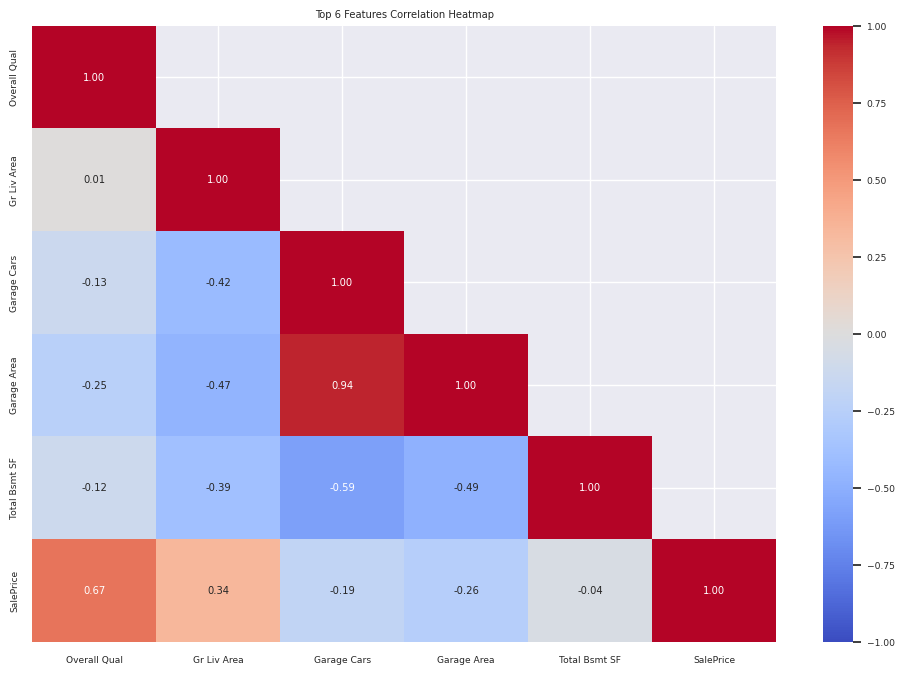

In [ ]:
# Calculate the correlation matrix
correlation_matrix = new_df_corr.corr()

# Creating a lower triangle mask
mask = np.tril(np.ones_like(correlation_matrix, dtype=bool))

# Invert the mask to get the upper triangle
mask = ~mask

# Set the size of the heatmap
plt.figure(figsize=(12, 8))

# Generating the heatmap
sns.heatmap(correlation_matrix, mask=mask, vmin=-1, vmax=1, cmap='coolwarm', annot=True, fmt=".2f")

# Set title and labels for the correlation heatmap
plt.title("Top 6 Features Correlation Heatmap")
plt.show()



Boolean inputs to the `inclusive` argument are deprecated in favour of `both` or `neither`.


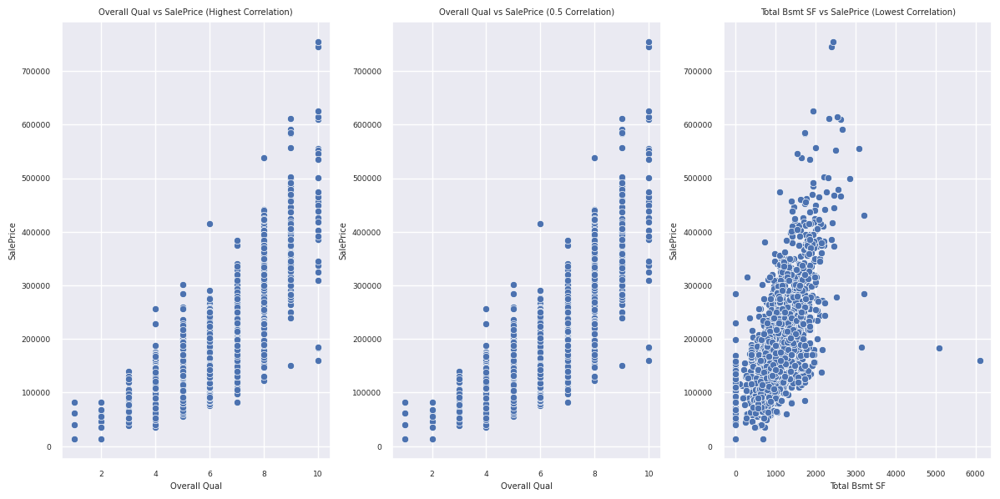

In [ ]:
# Create a figure with three subplots
fig, axs = plt.subplots(ncols=3, figsize=(12, 6))
sns.set(font_scale=0.6)

# Find the variable with the highest correlation with SalePrice (excluding SalePrice itself)
new_df_corr_top1 = new_df.corr()['SalePrice'].sort_values(ascending=False).index[1]

# Scatter plot for the variable with the highest positive correlation
sns.scatterplot(x=new_df[new_df_corr_top1], y=new_df['SalePrice'], ax=axs[0])
axs[0].set_title(f"{new_df_corr_top1} vs SalePrice (Highest Correlation)")

# Find variables with correlations between 0.4 and 0.6
medium_corr_values = new_df.corr()['SalePrice'].between(0.4, 0.6, inclusive=False)
if not medium_corr_values.empty:
    new_df_corr_medium1 = medium_corr_values.index[0]

    # Scatter plot for a variable with moderate correlation (closest to 0.5)
    sns.scatterplot(x=new_df[new_df_corr_medium1], y=new_df['SalePrice'], ax=axs[1])
    axs[1].set_title(f"{new_df_corr_medium1} vs SalePrice (0.5 Correlation)")

# Find the variable with the lowest correlation with SalePrice
new_df_corr_bottom1 = new_df.corr()['SalePrice'].sort_values(ascending=True).index[0]

# Scatter plot for the variable with the lowest correlation
sns.scatterplot(x=new_df[new_df_corr_bottom1], y=new_df['SalePrice'], ax=axs[2])
axs[2].set_title(f"{new_df_corr_bottom1} vs SalePrice (Lowest Correlation)")

# Display the plots
plt.tight_layout()
plt.show()


In [ ]:
train_new_df, test_new_df = train_test_split(new_df, test_size=0.3, random_state=42)

In [ ]:
print(test_new_df.shape)
print(train_new_df.shape)

(879, 6)
(2051, 6)


In [ ]:
y=train_new_df['SalePrice']
X=train_new_df.drop('SalePrice', axis=1)

In [ ]:
#trainsplit
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [ ]:
X_train

,Overall Qual,Gr Liv Area,Garage Cars,Garage Area,Total Bsmt SF
459,9.0,1456.0,2.0,539.0,1451.0
1484,6.0,848.0,2.0,420.0,848.0
1810,6.0,1721.0,2.0,471.0,928.0
2295,5.0,1432.0,2.0,531.0,716.0
2288,4.0,1092.0,1.0,286.0,546.0
...,...,...,...,...,...
2712,5.0,1159.0,1.0,336.0,1051.0
1545,6.0,1090.0,1.0,240.0,720.0
1639,9.0,1612.0,2.0,556.0,1612.0
2573,5.0,1144.0,1.0,796.0,1144.0


In [ ]:
##Building and Training of my black_box model

In [ ]:
#Initialize and train the XGBoosted Tree model
black_box_model = XGBRegressor(n_estimators=100, random_state=42)
black_box_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=42, ...)

In [ ]:
y_test

1669    110000.0
503     263550.0
2811    196500.0
1219     72500.0
389     158000.0
          ...   
703     103000.0
1923    120000.0
2611    115000.0
20      190000.0
1940    153000.0
Name: SalePrice, Length: 677, dtype: float64

In [ ]:
# Predict using the XGBoost regressor model
y_pred = black_box_model.predict(X_test)

# Calculate the evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

# Print the evaluation metrics
print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R-squared:", r2)


Mean Absolute Error: 22383.92671598043
Mean Squared Error: 1006126831.2163111
Root Mean Squared Error: 31719.502379708152
R-squared: 0.8461973103022857


In [ ]:
# Create a LIME explainer object
explainer = LimeTabularExplainer(X_train.values, mode="regression")

# Explain a prediction using LIME for the black-box model
explanation = explainer.explain_instance(X_test.iloc[0], black_box_model.predict)

# Visualize the explanation
explanation.show_in_notebook()


In [ ]:
#building my proxy model dataset from the blackbox prediction output
y_t = test_new_df['SalePrice']
X_t =test_new_df.drop('SalePrice',axis=1)

#y_t represents the target variable
#X_t represents the input features

In [ ]:
X_t

,Overall Qual,Gr Liv Area,Garage Cars,Garage Area,Total Bsmt SF
1357,8.0,1666.0,1.0,228.0,588.0
2367,6.0,1030.0,1.0,264.0,494.0
2822,7.0,1724.0,2.0,616.0,796.0
2126,4.0,990.0,0.0,0.0,990.0
1544,6.0,919.0,1.0,195.0,894.0
...,...,...,...,...,...
2618,5.0,1600.0,1.0,319.0,1484.0
497,8.0,2450.0,3.0,1069.0,1284.0
2382,10.0,2076.0,3.0,850.0,2076.0
325,5.0,1344.0,2.0,686.0,1344.0


In [ ]:
y_pred_t=black_box_model.predict(X_t)

In [ ]:
y_pred_t=pd.Series(y_pred_t)

In [ ]:
#  Assuming X_t is a DataFrame and y_pred_t is a DataFrame or Series
# X_t['sales'] = y_pred_t

In [ ]:
y_pred_t

0      194644.765625
1       98485.828125
2      215659.421875
3       84723.125000
4      112715.812500
           ...      
874    170373.671875
875    318611.937500
876    422389.093750
877    177426.578125
878    237313.500000
Length: 879, dtype: float32

In [ ]:
#method1

X_t['salesprice'] = y_pred_t.to_list()

In [ ]:
proxy_data=X_t
proxy_data.head()

,Overall Qual,Gr Liv Area,Garage Cars,Garage Area,Total Bsmt SF,salesprice
1357,8.0,1666.0,1.0,228.0,588.0,194644.765625
2367,6.0,1030.0,1.0,264.0,494.0,98485.828125
2822,7.0,1724.0,2.0,616.0,796.0,215659.421875
2126,4.0,990.0,0.0,0.0,990.0,84723.125000
1544,6.0,919.0,1.0,195.0,894.0,112715.812500


In [ ]:
#proxy model training
proxy_data
y_p= proxy_data['salesprice']
X_p=proxy_data.drop('salesprice',axis=1)

In [ ]:
#trainsplit
X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(X_p, y_p, test_size=0.33, random_state=42)

In [ ]:
y_train_p

211     127578.343750
2495    100081.781250
2852    120451.570312
1612    182548.562500
2123    197283.968750
            ...      
460     264766.968750
478     153154.671875
2321    212143.703125
2383    246795.312500
1690    400591.593750
Name: salesprice, Length: 588, dtype: float64

In [ ]:
Proxy_Model_LinearRegression= LinearRegression()
Proxy_Model_LinearRegression.fit(X_train_p, y_train_p)

LinearRegression()

In [ ]:
# Make predictions using the proxy model
y_pred_p = Proxy_Model_LinearRegression.predict(X_test_p)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_p, y_pred_p)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test_p, y_pred_p)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Calculate R-squared (R^2) - Coefficient of determination
r2 = r2_score(y_test_p, y_pred_p)

# Print or display the evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R^2):", r2)

Mean Absolute Error (MAE): 20161.320069171565
Mean Squared Error (MSE): 852482457.7652484
Root Mean Squared Error (RMSE): 29197.30223437173
R-squared (R^2): 0.8651631567752059


In [ ]:
print(len(y_test_p))
print(len(y_pred_p))


291
291


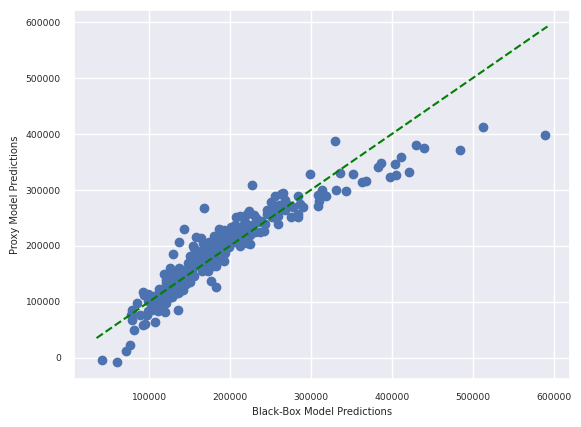

In [ ]:
# Scatter plot of actual black-box model predictions (y_test) vs. proxy model predictions (y_pred_p)
plt.scatter(y_test_p, y_pred_p)

# Diagonal line representing a perfect prediction match (y = x)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='green')

# Labeling the x and y axis
plt.xlabel('Black-Box Model Predictions')
plt.ylabel('Proxy Model Predictions')

# Show the plot
plt.show()


In [ ]:
# Create a SHAP explainer object
explainer = shap.Explainer(Proxy_Model_LinearRegression, X_train_p)

In [ ]:
shap_values = explainer.shap_values(X_test_p.iloc[:100])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


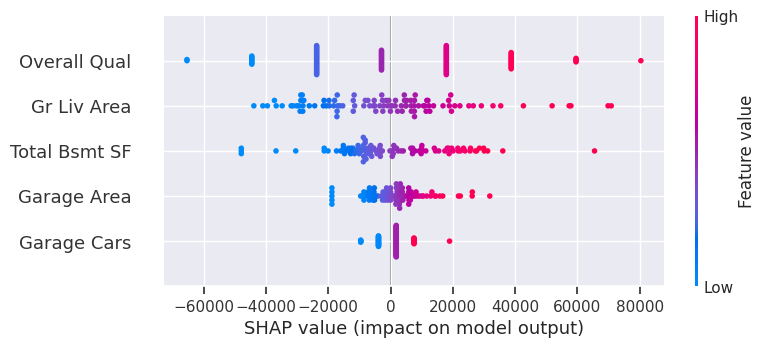

In [ ]:
# Summarize the SHAP values to get an overall feature importance
shap.summary_plot(shap_values, X_test_p.iloc[:100])










In [ ]:
# Create a LIME explainer object
explainer = LimeTabularExplainer(X_train_p.values, mode="regression")

# Explain a prediction using LIME for the black-box model
explanation = explainer.explain_instance(X_test_p.iloc[0], Proxy_Model_LinearRegression.predict)

# Visualize the explanation
explanation.show_in_notebook()


X does not have valid feature names, but LinearRegression was fitted with feature names


In [ ]:
# Explain model behavior using LIME
#explainer_lime = LimeTabularExplainer(X_train_p.values, mode="regression")
#explanation = explainer_lime.explain_instance(X_test_p.iloc[0].values, y_pred_t)
##xplanation.show_in_notebook()

In [ ]:
Proxy_Model_DecisionTreeRegressor= DecisionTreeRegressor()
Proxy_Model_DecisionTreeRegressor.fit(X_train_p, y_train_p)

DecisionTreeRegressor()

In [ ]:
# Make predictions using the proxy model
y_pred_p = Proxy_Model_DecisionTreeRegressor.predict(X_test_p)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test_p, y_pred_p)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test_p, y_pred_p)

#Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

#Calculate R-squared (R^2) - Coefficient of determination
r2 = r2_score(y_test_p, y_pred_p)

# Print or display the evaluation metrics
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)
print("Root Mean Squared Error (RMSE):", rmse)
print("R-squared (R^2):", r2)

Mean Absolute Error (MAE): 15607.119751396049
Mean Squared Error (MSE): 547020834.69729
Root Mean Squared Error (RMSE): 23388.47653647603
R-squared (R^2): 0.9134779116486106


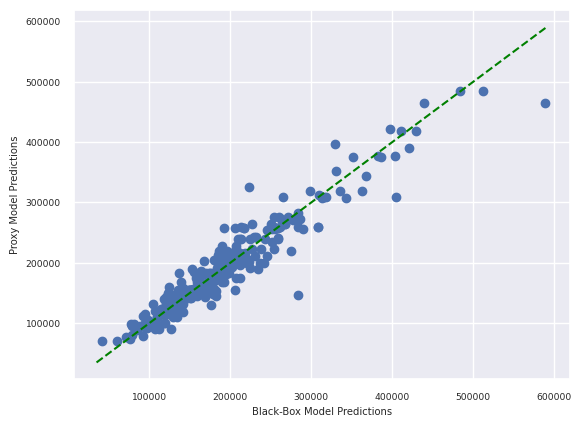

In [ ]:
# Scatter plot of actual black-box model predictions (y_test) vs. proxy model predictions (y_pred_p)
plt.scatter(y_test_p, y_pred_p)

# Diagonal line representing a perfect prediction match (y = x)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='green')

# Labeling the x and y axis
plt.xlabel('Black-Box Model Predictions')
plt.ylabel('Proxy Model Predictions')

# Show the plot
plt.show()


In [ ]:
# Create a SHAP explainer object
explainer = shap.Explainer(Proxy_Model_DecisionTreeRegressor, X_train_p)


In [ ]:
shap_values = explainer.shap_values(X_test_p.iloc[:100])

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


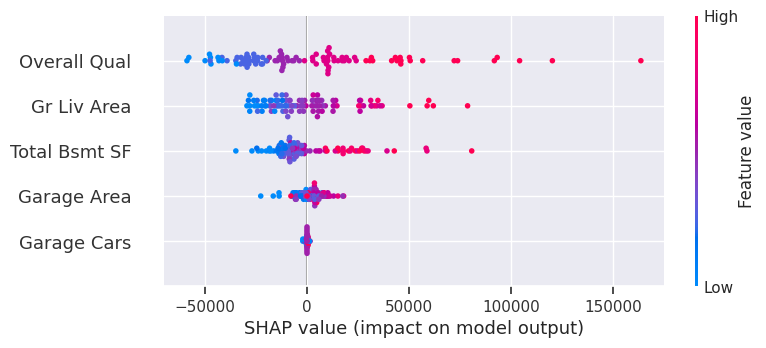

In [ ]:
# Summarize the SHAP values to get an overall feature importance
shap.summary_plot(shap_values, X_test_p.iloc[:100])

In [ ]:
# Create a LIME explainer object
explainer = LimeTabularExplainer(X_train_p.values, mode="regression")

# Explain a prediction using LIME for the black-box model
explanation = explainer.explain_instance(X_test_p.iloc[0], Proxy_Model_DecisionTreeRegressor.predict)

# Visualize the explanation
explanation.show_in_notebook()

X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


Proxy Model - Linear Regression:
  MSE: 852482457.7652484
  RMSE: 29197.30223437173
  MAE: 20161.320069171565
  R-squared: 0.8651631567752059

Proxy Model - Decision Tree:
  MSE: 527498060.2646279
  RMSE: 22967.32592760045
  MAE: 14768.22375698024
  R-squared: 0.9165658218472446

Black-Box Model - XGBoost:
  MSE: 363680403.15954846
  RMSE: 19070.40647599176
  MAE: 12623.61577802835
  R-squared: 0.9424768016537208


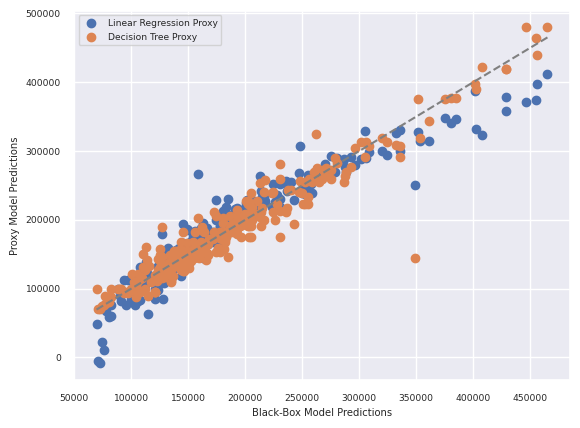

In [ ]:
# Create proxy models
Proxy_Model_LinearRegression = LinearRegression()
Proxy_Model_DecisionTreeRegressor = DecisionTreeRegressor()

# Fit proxy models
Proxy_Model_LinearRegression.fit(X_train_p, y_train_p)
Proxy_Model_DecisionTreeRegressor.fit(X_train_p, y_train_p)

# Create black-box model
black_box_model = xgb.XGBRegressor(n_estimators=100, random_state=42)

# Fit the black-box model
black_box_model.fit(X_train_p, y_train_p)

# Make predictions with all models
y_pred_proxy_linear = Proxy_Model_LinearRegression.predict(X_test_p)
y_pred_proxy_tree = Proxy_Model_DecisionTreeRegressor.predict(X_test_p)
y_pred_black_box = black_box_model.predict(X_test_p)

# Calculate evaluation metrics for proxy models
mse_proxy_linear = mean_squared_error(y_test_p, y_pred_proxy_linear)
rmse_proxy_linear = np.sqrt(mse_proxy_linear)
mae_proxy_linear = mean_absolute_error(y_test_p, y_pred_proxy_linear)
r2_proxy_linear = r2_score(y_test_p, y_pred_proxy_linear)

mse_proxy_tree = mean_squared_error(y_test_p, y_pred_proxy_tree)
rmse_proxy_tree = np.sqrt(mse_proxy_tree)
mae_proxy_tree = mean_absolute_error(y_test_p, y_pred_proxy_tree)
r2_proxy_tree = r2_score(y_test_p, y_pred_proxy_tree)

# Calculate evaluation metrics for the black-box model
mse_black_box = mean_squared_error(y_test_p, y_pred_black_box)
rmse_black_box = np.sqrt(mse_black_box)
mae_black_box = mean_absolute_error(y_test_p, y_pred_black_box)
r2_black_box = r2_score(y_test_p, y_pred_black_box)

# Display evaluation metrics
print("Proxy Model - Linear Regression:")
print(f"  MSE: {mse_proxy_linear}")
print(f"  RMSE: {rmse_proxy_linear}")
print(f"  MAE: {mae_proxy_linear}")
print(f"  R-squared: {r2_proxy_linear}")

print("\nProxy Model - Decision Tree:")
print(f"  MSE: {mse_proxy_tree}")
print(f"  RMSE: {rmse_proxy_tree}")
print(f"  MAE: {mae_proxy_tree}")
print(f"  R-squared: {r2_proxy_tree}")

print("\nBlack-Box Model - XGBoost:")
print(f"  MSE: {mse_black_box}")
print(f"  RMSE: {rmse_black_box}")
print(f"  MAE: {mae_black_box}")
print(f"  R-squared: {r2_black_box}")

# Visualize predictions
plt.scatter(y_pred_black_box, y_pred_proxy_linear, label='Linear Regression Proxy')
plt.scatter(y_pred_black_box, y_pred_proxy_tree, label='Decision Tree Proxy')
plt.plot([min(y_pred_black_box), max(y_pred_black_box)], [min(y_pred_black_box), max(y_pred_black_box)], linestyle='--', color='gray')
plt.xlabel('Black-Box Model Predictions')
plt.ylabel('Proxy Model Predictions')
plt.legend()
plt.show()









In [ ]:
# Create and fit your black-box model (XGBoost)
black_box_model = xgb.XGBRegressor(n_estimators=100, random_state=42)
black_box_model.fit(X_train_p, y_train_p)

# Create SHAP explainer for the black-box model
black_box_explainer = shap.Explainer(black_box_model, X_train)

# Create and fit your proxy models (Linear Regression and Decision Tree)
proxy_model_linear = LinearRegression()
proxy_model_linear.fit(X_train_p, y_train_p)

proxy_model_tree = DecisionTreeRegressor()
proxy_model_tree.fit(X_train_p, y_train_p)

# Create SHAP explainers for the proxy models
linear_explainer = shap.Explainer(proxy_model_linear, X_train_p)
tree_explainer = shap.Explainer(proxy_model_tree, X_train_p)

# Choose an instance for explanation (e.g., the first instance in your test set)
instance_to_explain = X_test_p.iloc[0]

# Calculate SHAP values for the black-box model
shap_values_black_box = black_box_explainer.shap_values(instance_to_explain)

# Calculate SHAP values for the proxy models (Linear Regression and Decision Tree)
shap_values_linear = linear_explainer.shap_values(instance_to_explain)
shap_values_tree = tree_explainer.shap_values(instance_to_explain)




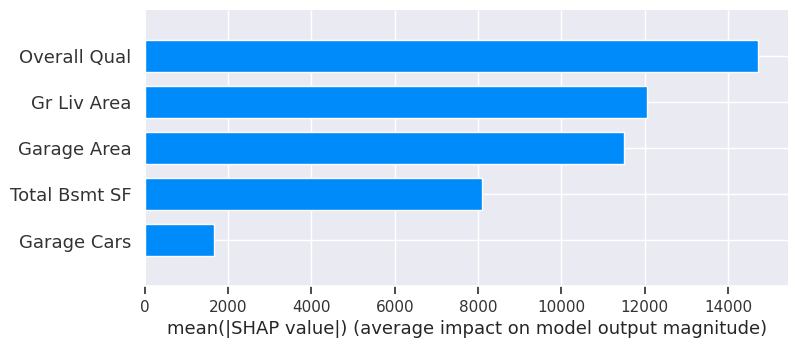

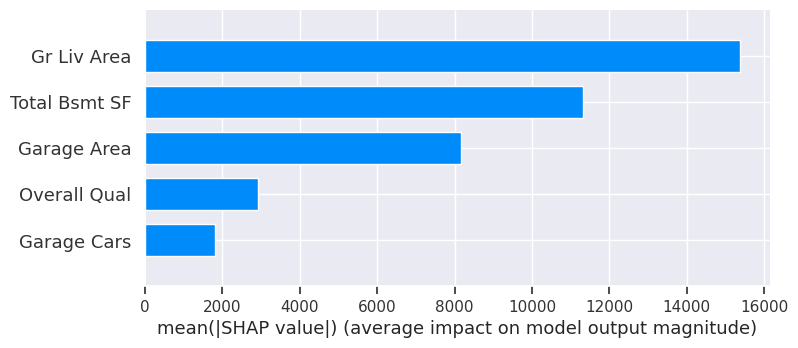

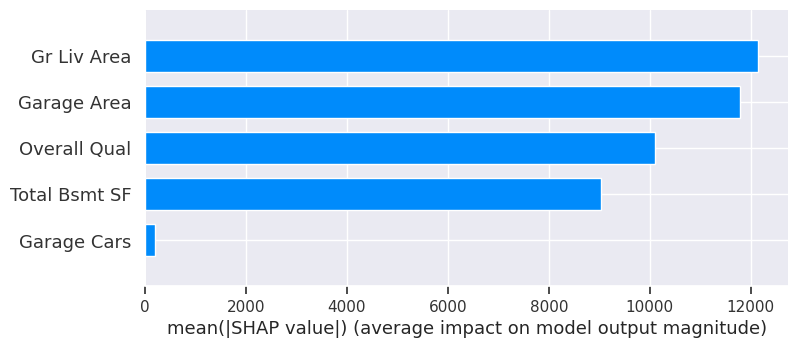

In [ ]:
# Transpose SHAP values to create a matrix
shap_values_black_box = np.array([shap_values_black_box])  # Wrap it in a list to make it a matrix
shap_values_linear = np.array([shap_values_linear])
shap_values_tree = np.array([shap_values_tree])

# Visualize SHAP values for the black-box model
shap.summary_plot(shap_values_black_box, X_test_p, plot_type='bar')

# Visualize SHAP values for the proxy models (Linear Regression and Decision Tree)
shap.summary_plot(shap_values_linear, X_test_p, plot_type='bar')
shap.summary_plot(shap_values_tree, X_test_p, plot_type='bar')


In [ ]:
# Create LIME explainer for the black-box model
black_box_explainer = LimeTabularExplainer(X_train_p.values, mode="regression")

# Create and fit your proxy models (Linear Regression and Decision Tree)
Proxy_Model_LinearRegression = LinearRegression()
Proxy_Model_LinearRegression.fit(X_train_p, y_train_p)

Proxy_Model_DecisionTreeRegressor = DecisionTreeRegressor()
Proxy_Model_DecisionTreeRegressor.fit(X_train_p, y_train_p)

# Create LIME explainers for the proxy models
linearRegression_explainer = LimeTabularExplainer(X_train_p.values, mode="regression")
DecisionTreeRegressor_explainer = LimeTabularExplainer(X_train_p.values, mode="regression")

In [ ]:
instance_to_explain = X_test_p.iloc[0]

In [ ]:
# Create LIME explainer objects for the proxy models (Linear Regression and Decision Tree)
explainer_linear = LimeTabularExplainer(X_train_p.values, mode="regression")
explainer_tree = LimeTabularExplainer(X_train_p.values, mode="regression")

# Explain instances using the explainer objects
explanation_linearRegression = explainer_linear.explain_instance(instance_to_explain, Proxy_Model_LinearRegression.predict)
explanation_DecisionTreeRegressor = explainer_tree.explain_instance(instance_to_explain, Proxy_Model_DecisionTreeRegressor.predict)


X does not have valid feature names, but LinearRegression was fitted with feature names
X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


In [ ]:
# Visualize LIME explanation for the black-box model (XGBoost Regressor)
explanation_black_box.show_in_notebook()

# Visualize LIME explanation for the proxy models (Linear Regression and Decision Tree)
explanation_linearRegression.show_in_notebook()
explanation_DecisionTreeRegressor.show_in_notebook()
